# "Fastai Image Regression"
> "A thorough working of CNN in an real world Image Regression Task"
- toc: false
- branch: master
- badges: true
- comments: true
- categories: [fastpages, jupyter]

# Introduction

In this Notebook, I have tried to build a model which predicts the age of a person based on his or her face.

The techniques I have used to build this **Image Regression model** are based on Fastai's CNN  models.

The dataset I have used for this task are as follows:

1. UTK Face Data
2. Appa Real Face Data
3. IMDB Wiki Face Data

In the course of this analysis, I have learnt many things:

1. How to augment the data using Fastai's Image augmentation techinues.
2. Loading and using Cadene's Pretrained Models (https://github.com/Cadene/pretrained-models.pytorch)
3. How to use Image resizing technique which basically refers to gradually increase the size of image while training. This helps in achieving greater prediction accuracy.
4. Discriminative Layers Training technique

## Import Libraries

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

import warnings
warnings.filterwarnings('ignore')
import gc
gc.collect()

['picture-2', 'picture4', 'wiki-face-data', 'picture-1', 'utk-face-cropped', 'picture-6', 'imdb-wiki-faces-dataset', 'picture-5', 'picture-3', 'appa-real-face-cropped']


0

In [2]:
!pip install pretrainedmodels

%reload_ext autoreload
%autoreload 2
%matplotlib inline

!pip install fastai==1.0.57
import fastai

from fastai import *
from fastai.vision import *

from torchvision.models import *
import pretrainedmodels

from utils import *
import sys

from fastai.callbacks.hooks import *

from fastai.callbacks.tracker import EarlyStoppingCallback
from fastai.callbacks.tracker import SaveModelCallback

path_wiki = Path('../input/wiki-face-data/wiki_crop/wiki_crop/')
path_imdb = Path('../input/imdb-wiki-faces-dataset/imdb_crop/imdb_crop/')


     |████████████████████████████████| 61kB 4.9MB/s eta 0:00:011
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-cp36-none-any.whl size=60963 sha256=b82608a0218b0ec36665a9794d3c75dedcac7ece90c42fab8c881ef88f2d2389
  Stored in directory: /tmp/.cache/pip/wheels/69/df/63/62583c096289713f22db605aa2334de5b591d59861a02c2ecd
Successfully built pretrainedmodels


In [3]:
import scipy.io
import numpy as np
import pandas as pd
from datetime import datetime, timedelta

## Loading the Data

In [4]:
mat_wiki = scipy.io.loadmat('../input/wiki-face-data/wiki_crop/wiki_crop/wiki.mat')
mat_imdb = scipy.io.loadmat('../input/imdb-wiki-faces-dataset/imdb_crop/imdb_crop/imdb.mat')

In [5]:
columns = ["dob", "photo_taken", "full_path", "gender", "name", "face_location", 
           "face_score", "second_face_score", 'celeb_names', 'celeb_id']

In [6]:
instances_wiki = mat_wiki['wiki'][0][0][0].shape[1]
instances_imdb = mat_imdb['imdb'][0][0][0].shape[1]


df_wiki = pd.DataFrame(index = range(0,instances_wiki), columns = columns)
df_imdb = pd.DataFrame(index = range(0,instances_imdb), columns = columns)

In [7]:
for i in mat_wiki:
    if i == "wiki":
        current_array = mat_wiki[i][0][0]
        for j in range(len(current_array)):
            #print(columns[j],": ",current_array[j])
            df_wiki[columns[j]] = pd.DataFrame(current_array[j][0])
            

for i in mat_imdb:
    if i == "imdb":
        current_array = mat_imdb[i][0][0]
        for j in range(len(current_array)):
            #print(columns[j],": ",current_array[j])
            df_imdb[columns[j]] = pd.DataFrame(current_array[j][0])

In [8]:
df_wiki.head()

,dob,photo_taken,full_path,gender,name,face_location,face_score,second_face_score,celeb_names,celeb_id
0,723671,2009,[17/10000217_1981-05-05_2009.jpg],1.0,[Sami Jauhojärvi],"[[111.29109473290997, 111.29109473290997, 252....",4.300962,NaN,NaN,NaN
1,703186,1964,[48/10000548_1925-04-04_1964.jpg],1.0,[Dettmar Cramer],"[[252.48330229530742, 126.68165114765371, 354....",2.645639,1.949248,NaN,NaN
2,711677,2008,[12/100012_1948-07-03_2008.jpg],1.0,[Marc Okrand],"[[113.52, 169.83999999999997, 366.08, 422.4]]",4.329329,NaN,NaN,NaN
3,705061,1961,[65/10001965_1930-05-23_1961.jpg],1.0,[Aleksandar Matanović],"[[1, 1, 634, 440]]",-inf,NaN,NaN,NaN
4,720044,2012,[16/10002116_1971-05-31_2012.jpg],0.0,[Diana Damrau],"[[171.61031405173117, 75.57451239763239, 266.7...",3.408442,NaN,NaN,NaN


In [9]:
df_imdb.head()

,dob,photo_taken,full_path,gender,name,face_location,face_score,second_face_score,celeb_names,celeb_id
0,693726,1968,[01/nm0000001_rm124825600_1899-5-10_1968.jpg],1.0,[Fred Astaire],"[[1072.926, 161.838, 1214.7839999999999, 303.6...",1.459693,1.118973,['Lee' George Quinones],6488
1,693726,1970,[01/nm0000001_rm3343756032_1899-5-10_1970.jpg],1.0,[Fred Astaire],"[[477.184, 100.352, 622.592, 245.76]]",2.543198,1.852008,['Weird Al' Yankovic],6488
2,693726,1968,[01/nm0000001_rm577153792_1899-5-10_1968.jpg],1.0,[Fred Astaire],"[[114.96964308962852, 114.96964308962852, 451....",3.455579,2.985660,[2 Chainz],6488
3,693726,1968,[01/nm0000001_rm946909184_1899-5-10_1968.jpg],1.0,[Fred Astaire],"[[622.8855056426588, 424.21750383700805, 844.3...",1.872117,NaN,[50 Cent],6488
4,693726,1968,[01/nm0000001_rm980463616_1899-5-10_1968.jpg],1.0,[Fred Astaire],"[[1013.8590023603723, 233.8820422075853, 1201....",1.158766,NaN,[A Martinez],6488


In [10]:
df_wiki.shape, df_imdb.shape

((62328, 10), (460723, 10))

In [11]:
def datenum_to_datetime(datenum):
    
    try:
        days = datenum % 1
        hours = days % 1 * 24
        minutes = hours % 1 * 60
        seconds = minutes % 1 * 60
        exact_date = datetime.fromordinal(int(datenum)) \
           + timedelta(days=int(days)) \
           + timedelta(hours=int(hours)) \
           + timedelta(minutes=int(minutes)) \
           + timedelta(seconds=round(seconds)) \
           - timedelta(days=366)
    
        return exact_date.year
    
    except(ValueError, TypeError, OverflowError):
        
        return np.nan  

In [12]:
df_wiki['date_of_birth'] = df_wiki['dob'].apply(datenum_to_datetime) 
df_imdb['date_of_birth'] = df_imdb['dob'].apply(datenum_to_datetime) 

In [13]:
df_wiki['date_of_birth'].value_counts()
df_imdb['date_of_birth'].value_counts()

1969.0    16511
1978.0    16062
1971.0    15344
1976.0    14232
1970.0    14184
          ...  
1879.0        1
2012.0        1
1883.0        1
1888.0        1
1732.0        1
Name: date_of_birth, Length: 128, dtype: int64

In [14]:
df_wiki['age'] = df_wiki['photo_taken'] - df_wiki['date_of_birth']

#remove pictures does not include face
df_wiki = df_wiki[df_wiki['face_score'] != -np.inf]

#some pictures include more than one face, remove them
df_wiki = df_wiki[df_wiki['second_face_score'].isna()]

#check threshold
df_wiki = df_wiki[df_wiki['face_score'] >= 3.5]

df_wiki = df_wiki.drop(columns = ['name','face_score','second_face_score','date_of_birth','face_location'])

#some guys seem to be greater than 100. some of these are paintings. remove these old guys
df_wiki = df_wiki[df_wiki['age'] <= 100]

#some guys seem to be unborn in the data set
df_wiki = df_wiki[df_wiki['age'] > 0]

In [15]:
df_imdb['age'] = df_imdb['photo_taken'] - df_imdb['date_of_birth']

#remove pictures does not include face
df_imdb = df_imdb[df_imdb['face_score'] != -np.inf]

#some pictures include more than one face, remove them
df_imdb = df_imdb[df_imdb['second_face_score'].isna()]

#check threshold
df_imdb = df_imdb[df_imdb['face_score'] >= 3.5]

df_imdb = df_imdb.drop(columns = ['name','face_score','second_face_score','date_of_birth','face_location'])

#some guys seem to be greater than 100. some of these are paintings. remove these old guys
df_imdb = df_imdb[df_imdb['age'] <= 100]

#some guys seem to be unborn in the data set
df_imdb = df_imdb[df_imdb['age'] > 0]

In [16]:
df_wiki.head()

,dob,photo_taken,full_path,gender,celeb_names,celeb_id,age
0,723671,2009,[17/10000217_1981-05-05_2009.jpg],1.0,NaN,NaN,28
2,711677,2008,[12/100012_1948-07-03_2008.jpg],1.0,NaN,NaN,60
5,716189,2012,[02/10002702_1960-11-09_2012.jpg],0.0,NaN,NaN,52
6,707745,1971,[41/10003541_1937-09-27_1971.jpg],1.0,NaN,NaN,34
10,697114,1950,[99/10004299_1908-08-19_1950.jpg],1.0,NaN,NaN,42


In [17]:
df_wiki.shape, df_imdb.shape

((17096, 7), (73683, 7))

In [18]:
df_wiki['age'] = df_wiki['age'].apply(lambda x: int(x))
df_imdb['age'] = df_imdb['age'].apply(lambda x: int(x))

In [19]:
print(type(df_wiki['age']))
df_wiki['age'].value_counts()
df_imdb['age'].value_counts()

<class 'pandas.core.series.Series'>


31    2757
32    2677
29    2578
33    2545
30    2532
      ... 
96       1
95       1
93       1
92       1
3        1
Name: age, Length: 98, dtype: int64

In [20]:
df_wiki = df_wiki.drop(columns=['dob', 'photo_taken'])
df_imdb = df_imdb.drop(columns=['dob', 'photo_taken'])

In [21]:
df_age_wiki = df_wiki.drop(columns=['gender', 'celeb_names', 'celeb_id'])
df_age_imdb = df_imdb.drop(columns=['gender', 'celeb_names', 'celeb_id'])

In [22]:
df_age_wiki['age'].value_counts()

24    685
25    658
26    658
27    651
23    649
     ... 
97      1
6       1
5       1
94      1
95      1
Name: age, Length: 97, dtype: int64

In [23]:
df_imdb['age'].value_counts()

31    2757
32    2677
29    2578
33    2545
30    2532
      ... 
96       1
95       1
93       1
92       1
3        1
Name: age, Length: 98, dtype: int64

In [24]:
df_age_wiki['full_path'] = df_age_wiki['full_path'].str.get(0)
df_age_imdb['full_path'] = df_age_imdb['full_path'].str.get(0)

In [25]:
df_age_wiki.dropna(axis=0, inplace=True)
df_age_imdb.dropna(axis=0, inplace=True)

In [26]:
df_age_wiki.head()

,full_path,age
0,17/10000217_1981-05-05_2009.jpg,28
2,12/100012_1948-07-03_2008.jpg,60
5,02/10002702_1960-11-09_2012.jpg,52
6,41/10003541_1937-09-27_1971.jpg,34
10,99/10004299_1908-08-19_1950.jpg,42


In [27]:
df_age_imdb.head()

,full_path,age
7,02/nm0000002_rm1363385088_1924-9-16_2004.jpg,80
12,02/nm0000002_rm221957120_1924-9-16_1974.jpg,50
14,02/nm0000002_rm238734336_1924-9-16_1974.jpg,50
15,02/nm0000002_rm2585828096_1924-9-16_2006.jpg,82
18,02/nm0000002_rm2769394176_1924-9-16_2006.jpg,82


In [28]:
df_age_wiki['age'] = df_age_wiki['age'].apply(lambda x: int(x))
df_age_imdb['age'] = df_age_imdb['age'].apply(lambda x: int(x))

In [29]:
df_age_wiki.shape, df_age_imdb.shape

((17096, 2), (73683, 2))

In [30]:
max_age = df_age_wiki["age"].max(); print(max_age)
min_age = df_age_wiki["age"].min(); print(min_age)

100
1


In [31]:
max_age = df_age_imdb["age"].max(); print(max_age)
min_age = df_age_imdb["age"].min(); print(min_age)

99
1


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fcf17fc1278>]], dtype=object)

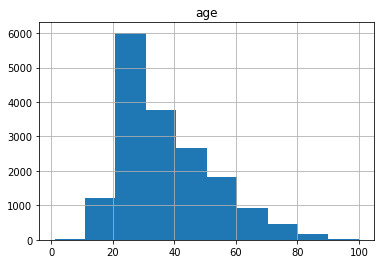

In [32]:
df_age_wiki.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fcf163a30f0>]], dtype=object)

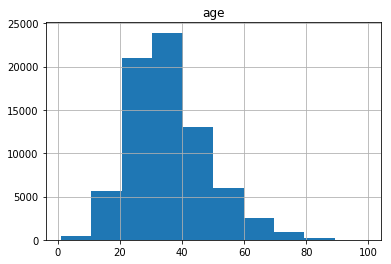

In [33]:
df_age_imdb.hist()

In [34]:
seed = 42

# # python RNG
# import random
# random.seed(seed)

# # pytorch RNGs
# import torch
# torch.manual_seed(seed)
# torch.backends.cudnn.deterministic = True
# if torch.cuda.is_available(): torch.cuda.manual_seed_all(seed)

# numpy RNG
import numpy as np
np.random.seed(seed)

In [35]:
path = Path('../input/')

In [36]:
path_utk = Path('../input/utk-face-cropped/utkcropped/utkcropped/')

In [37]:
def extract_age(filename):
    return float(filename.stem.split('_')[0])

## Preparing the Data for Fastai Models

In [38]:
tfms = get_transforms(max_rotate= 10.,max_zoom=1., max_lighting=0.20, do_flip=False,
                      max_warp=0., xtra_tfms=[flip_lr(), brightness(change=(0.3, 0.60), p=0.7), contrast(scale=(0.5, 2), p=0.7),
                                              crop_pad(size=600, padding_mode='border', row_pct=0.,col_pct=0.),
                                              rand_zoom(scale=(1.,1.5)), rand_crop(),
                                              perspective_warp(magnitude=(-0.1,0.1)),
                                              #jitter(magnitude=(-0.05,0.05), p=0.5),
                                              symmetric_warp(magnitude=(-0.1,0.1)) ])

path_imdb = Path('../input/imdb-wiki-faces-dataset/imdb_crop/imdb_crop/')
path_wiki = Path('../input/wiki-face-data/wiki_crop/wiki_crop/')


data_imdb = ImageList.from_df(df_age_imdb, path_imdb, cols=['full_path'], folder ='.').split_by_rand_pct(0.2, seed=42).label_from_df(label_cls=FloatList).transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=128).databunch(bs=64*2,num_workers=0).normalize(imagenet_stats)
data_wiki_small = ImageList.from_df(df_age_wiki, path_wiki, cols=['full_path'], folder ='.').split_by_rand_pct(0.2, seed=42).label_from_df(label_cls=FloatList).transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=128).databunch(bs=64*2,num_workers=0).normalize(imagenet_stats)
data_wiki_big = ImageList.from_df(df_age_wiki, path_wiki, cols=['full_path'], folder ='.').split_by_rand_pct(0.2, seed=42).label_from_df(label_cls=FloatList).transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=256).databunch(bs=64*2,num_workers=0).normalize(imagenet_stats)

In [39]:
data_utk_small = ImageList.from_folder(path_utk).split_by_rand_pct(0.2, seed=42).label_from_func(extract_age, label_cls=FloatList).transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=128).databunch(bs=64*2,num_workers=0).normalize(imagenet_stats)
data_utk_big = ImageList.from_folder(path_utk).split_by_rand_pct(0.2, seed=42).label_from_func(extract_age, label_cls=FloatList).transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=256).databunch(bs=64*2,num_workers=0).normalize(imagenet_stats)

In [40]:
df_appa = pd.read_csv('/kaggle/input/appa-real-face-cropped/labels.csv')
df_appa.head()

,file_name,real_age
0,000000.jpg,4
1,000001.jpg,18
2,000002.jpg,80
3,000003.jpg,50
4,000004.jpg,17


In [41]:
df_appa.rename(columns = {"file_name":"full_path", "real_age":"age"}, inplace=True)
df_appa['age'] = df_appa['age'].apply(lambda x: int(float(x)))

In [42]:
path = Path('../input/appa-real-face-cropped/final_files/final_files/')
path_csv = '../input/appa-real-face-cropped/'
path_folder = '../input/appa-real-face-cropped/final_files/final_files/'

data_appa_small = ImageList.from_df(df_appa, path, cols=['full_path'], folder ='.').split_by_rand_pct(0.2, seed=42).label_from_df(label_cls=FloatList).transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=128).databunch(bs=64*2,num_workers=0).normalize(imagenet_stats)
data_appa_big = ImageList.from_df(df_appa, path, cols=['full_path'], folder ='.').split_by_rand_pct(0.2, seed=42).label_from_df(label_cls=FloatList).transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=256).databunch(bs=64*2,num_workers=0).normalize(imagenet_stats)


## A look at the Images

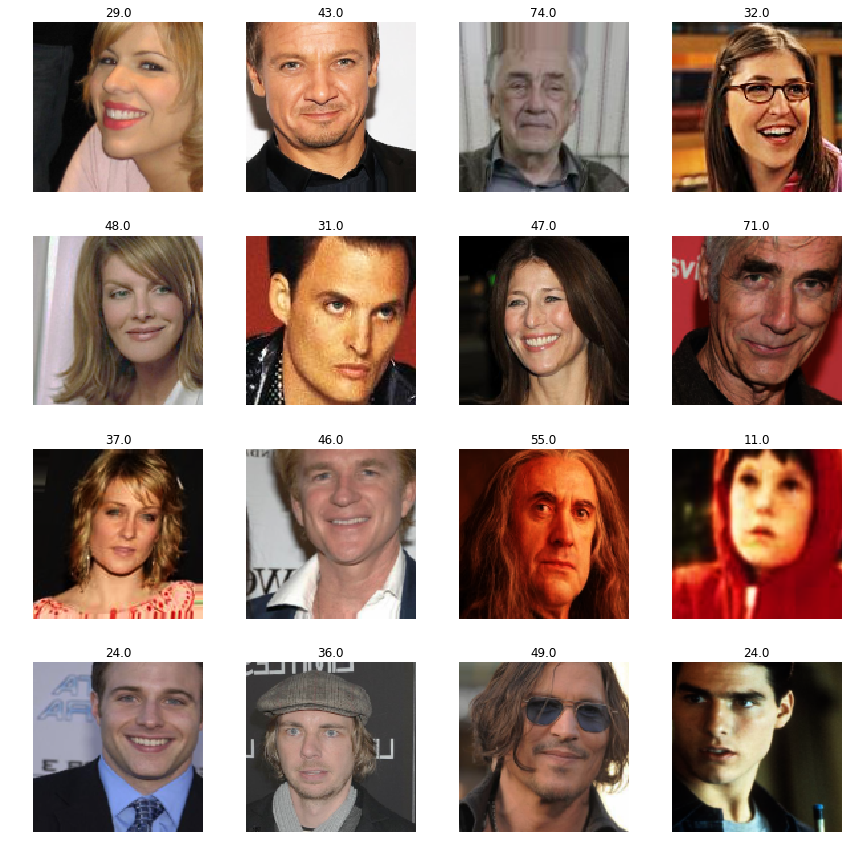

In [43]:
data_imdb.show_batch(4, figsize=(12,12))

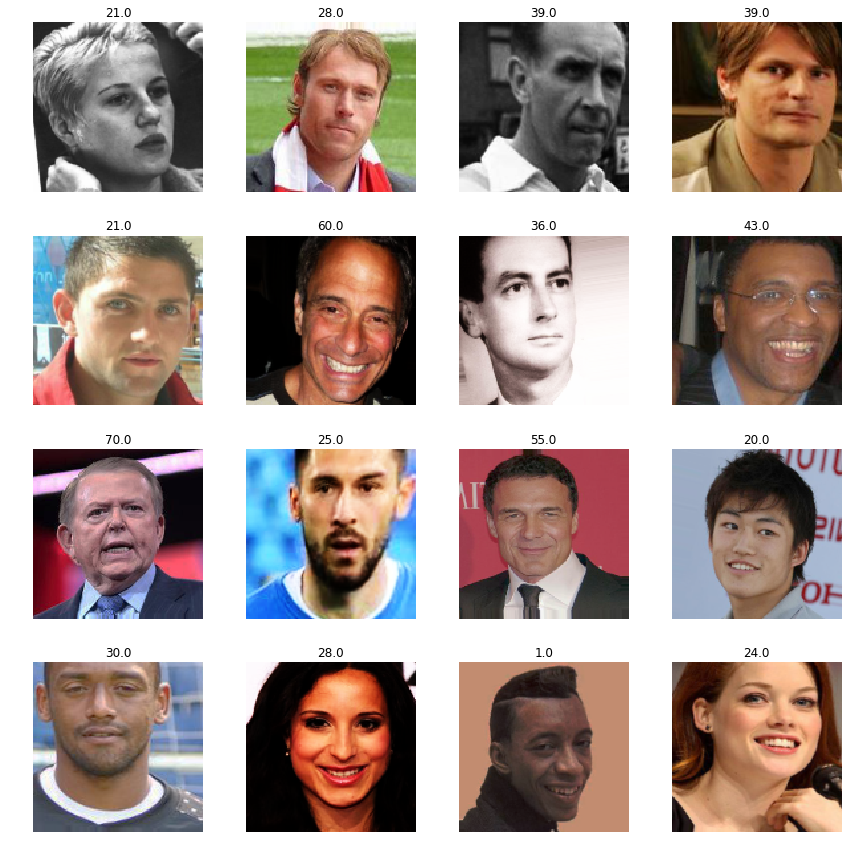

In [44]:
data_wiki_small.show_batch(4, figsize=(12,12))

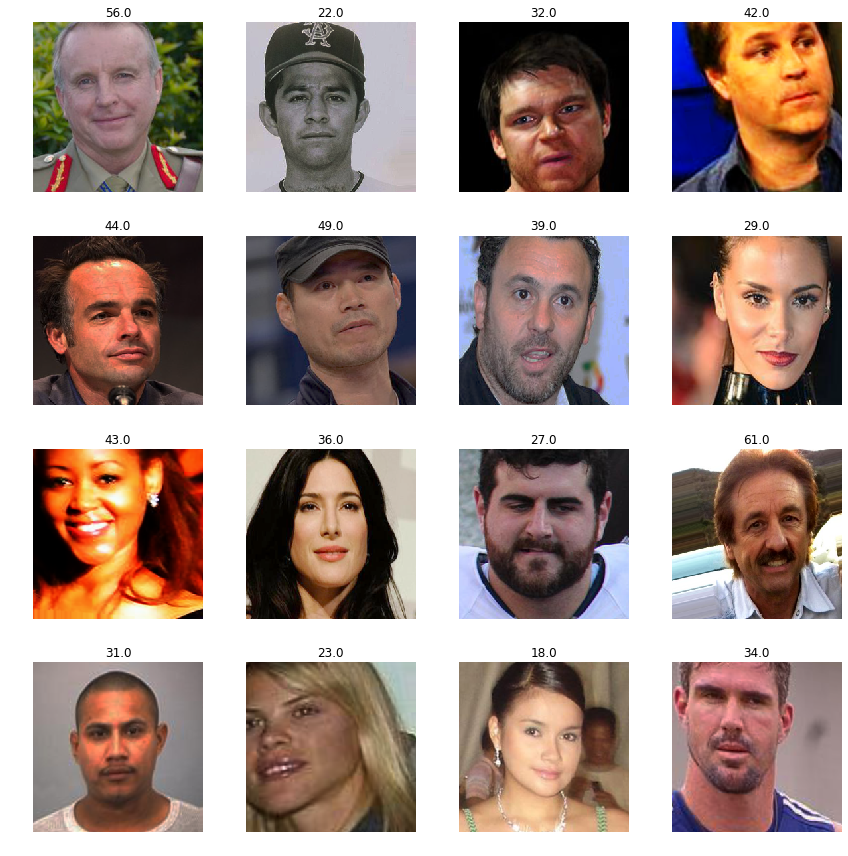

In [45]:
data_wiki_big.show_batch(4, figsize=(12,12))

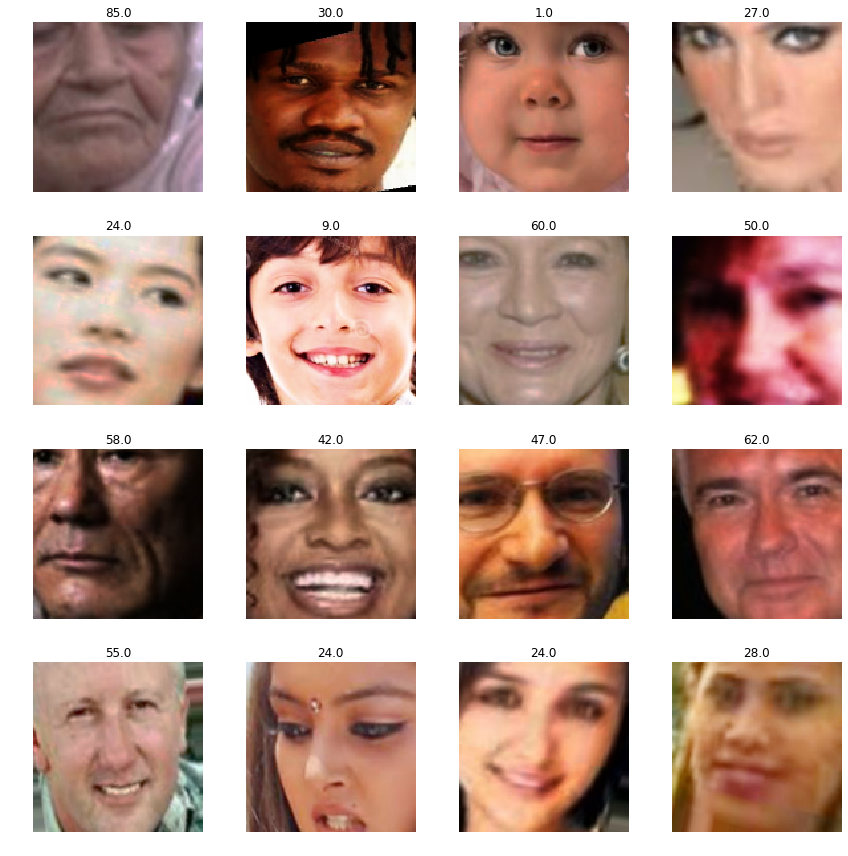

In [46]:
data_utk_small.show_batch(4, figsize=(12,12))

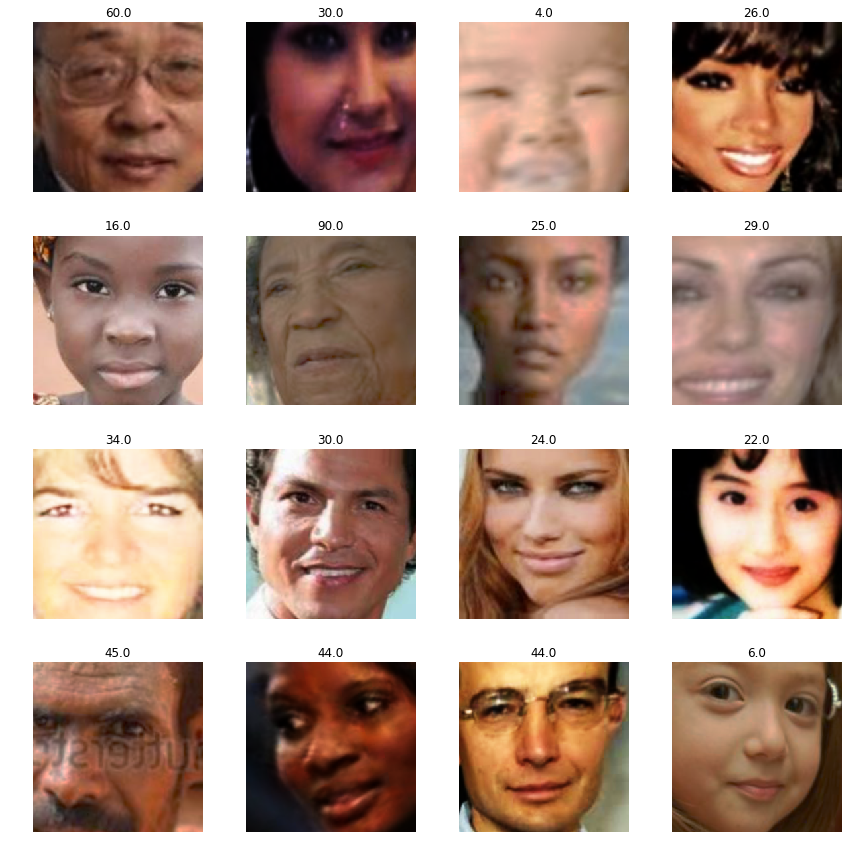

In [47]:
data_utk_big.show_batch(4, figsize=(12,12))

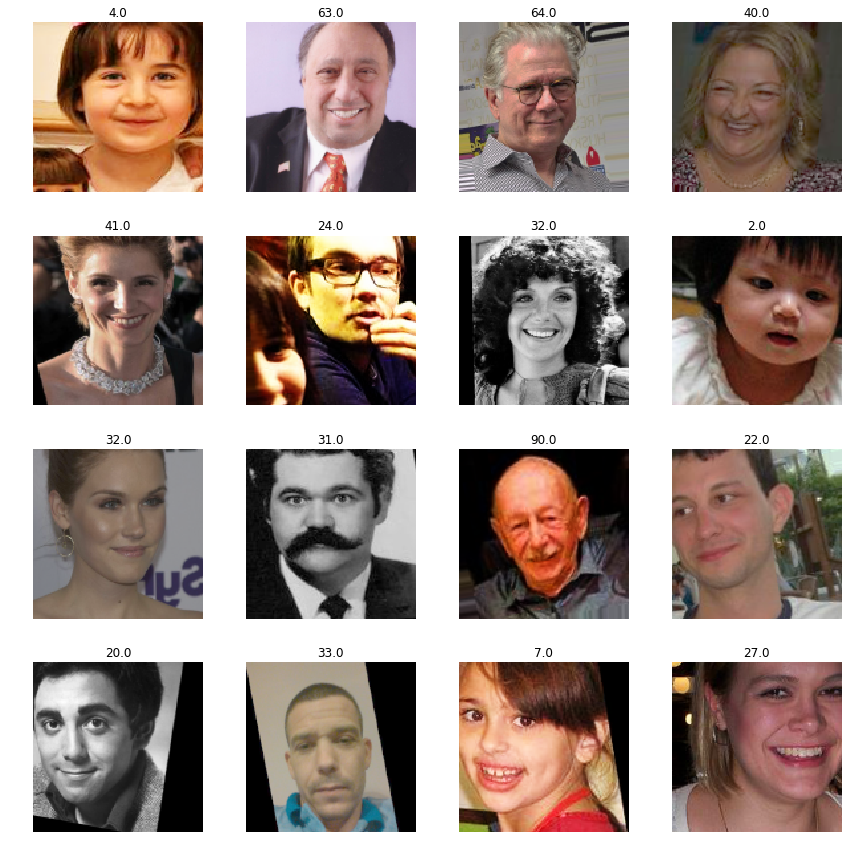

In [48]:
data_appa_small.show_batch(4, figsize=(12,12))

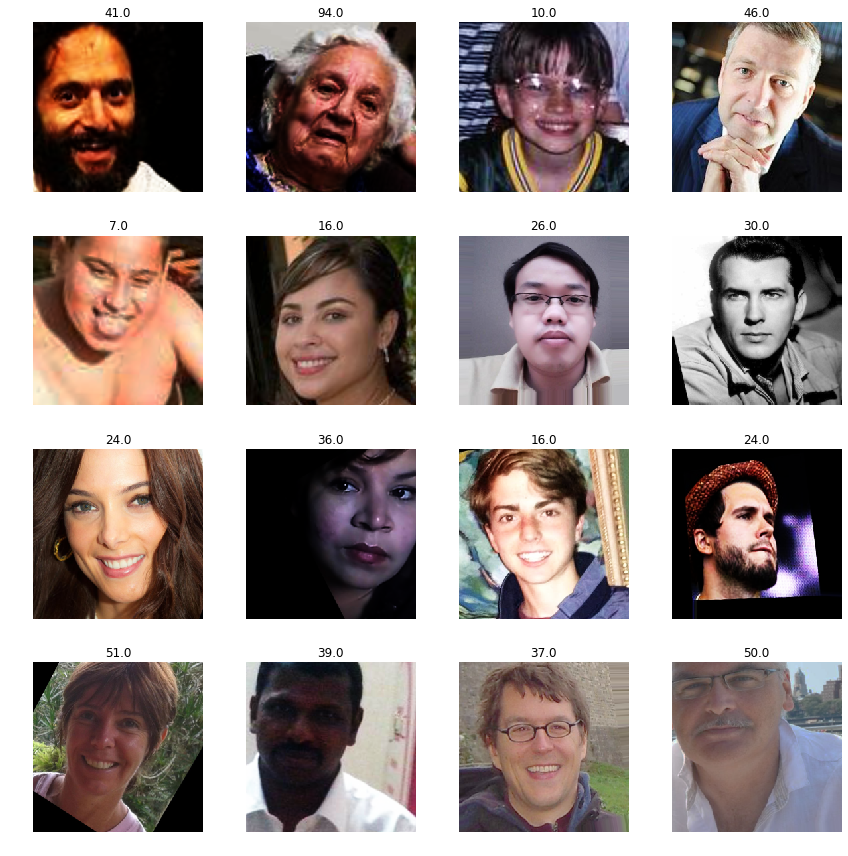

In [49]:
data_appa_big.show_batch(4, figsize=(12,12))

## Fastai Modelling

In [50]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from pathlib import Path
import random

In [51]:
opt_func = partial(optim.Adam, betas=(0.9,0.99), eps=1e-5)

In [52]:
def resnet(pretrained=False):
    pretrained = 'imagenet' if pretrained else None
    model = pretrainedmodels.resnet34(pretrained=pretrained)
    return model

In [53]:
class L1LossFlat(nn.SmoothL1Loss):
    def forward(self, input:Tensor, target:Tensor) -> Rank0Tensor:
        return super().forward(input.view(-1), target.view(-1))

In [54]:
df_utk_small = data_utk_small.to_df()

In [55]:
df_utk_small.head()

,x,y
0,39_0_1_20170116143117964.jpg.chip.jpg,39.0
1,54_0_3_20170104202315035.jpg.chip.jpg,54.0
2,1_0_2_20161219154715885.jpg.chip.jpg,1.0
3,30_1_2_20170116192313635.jpg.chip.jpg,30.0
4,41_1_0_20170117133203334.jpg.chip.jpg,41.0


In [56]:
df_utk_small.rename(columns = {"x":"full_path", "y":"age"}, inplace=True)
df_utk_small['age'] = df_utk_small['age'].apply(lambda x: int(float(x)))

In [57]:
df_utk_small.head()

,full_path,age
0,39_0_1_20170116143117964.jpg.chip.jpg,39
1,54_0_3_20170104202315035.jpg.chip.jpg,54
2,1_0_2_20161219154715885.jpg.chip.jpg,1
3,30_1_2_20170116192313635.jpg.chip.jpg,30
4,41_1_0_20170117133203334.jpg.chip.jpg,41


In [58]:
df_appa.head()

,full_path,age
0,000000.jpg,4
1,000001.jpg,18
2,000002.jpg,80
3,000003.jpg,50
4,000004.jpg,17


In [59]:
src_wiki = '../input/wiki-face-data/wiki_crop/wiki_crop/'
src_utk = '../input/utk-face-cropped/utkcropped/utkcropped/'
src_appa = '../input/appa-real-face-cropped/final_files/'

dest = '../working/wiki_utk/'

import os
import shutil
import pathlib

pathlib.Path(dest).mkdir(parents=True, exist_ok=True)

os.listdir(dest)

[]

In [60]:
for root, dirs, files in os.walk(src_wiki):
    for file in files:
        path_file = os.path.join(root,file)
        shutil.copy2(path_file, dest)

In [61]:
for root, dirs, files in os.walk(src_utk):
    for file in files:
        path_file = os.path.join(root,file)
        shutil.copy2(path_file,dest)

In [62]:
for root, dirs, files in os.walk(src_appa):
    for file in files:
        path_file = os.path.join(root,file)
        shutil.copy2(path_file,dest)

In [63]:
df_age_wiki.head()

,full_path,age
0,17/10000217_1981-05-05_2009.jpg,28
2,12/100012_1948-07-03_2008.jpg,60
5,02/10002702_1960-11-09_2012.jpg,52
6,41/10003541_1937-09-27_1971.jpg,34
10,99/10004299_1908-08-19_1950.jpg,42


In [64]:
df_age_wiki['full_path'] = df_age_wiki['full_path'].str[3:]
df_age_wiki.head()

,full_path,age
0,10000217_1981-05-05_2009.jpg,28
2,100012_1948-07-03_2008.jpg,60
5,10002702_1960-11-09_2012.jpg,52
6,10003541_1937-09-27_1971.jpg,34
10,10004299_1908-08-19_1950.jpg,42


In [65]:
frames = [df_age_wiki, df_utk_small, df_appa]
df_wiki_utk_appa = pd.concat(frames)

In [66]:
df_wiki_utk_appa.head()

,full_path,age
0,10000217_1981-05-05_2009.jpg,28
2,100012_1948-07-03_2008.jpg,60
5,10002702_1960-11-09_2012.jpg,52
6,10003541_1937-09-27_1971.jpg,34
10,10004299_1908-08-19_1950.jpg,42


In [67]:
df_wiki_utk_appa.shape

(43655, 2)

In [68]:
os.listdir(dest)

['29_1_1_20170112234606137.jpg.chip.jpg',
 '48_1_0_20170105000634011.jpg.chip.jpg',
 '32_0_1_20170113001322715.jpg.chip.jpg',
 '26_0_0_20170116192554607.jpg.chip.jpg',
 '36561562_1888-07-24_2004.jpg',
 '2338017_1960-09-21_2002.jpg',
 '3484443_1981-06-17_2006.jpg',
 '35_1_1_20170113003536772.jpg.chip.jpg',
 '52517_1934-10-07_1964.jpg',
 '46348054_1920-08-10_1942.jpg',
 '15_1_2_20170102234824195.jpg.chip.jpg',
 '903342_1972-06-28_2008.jpg',
 '29_0_1_20170117094745480.jpg.chip.jpg',
 '3762844_1945-09-25_1978.jpg',
 '27846664_1901-11-01_2010.jpg',
 '1051405_1969-11-19_2007.jpg',
 '249274_1955-07-01_2012.jpg',
 '20053572_1982-04-06_2009.jpg',
 '24815184_1864-08-15_2004.jpg',
 '001081.jpg',
 '12653807_1970-07-21_2011.jpg',
 '1_1_0_20170109193704430.jpg.chip.jpg',
 '26537728_1951-10-11_1978.jpg',
 '9952833_1990-06-05_2013.jpg',
 '88_0_1_20170116144533236.jpg.chip.jpg',
 '9632534_1957-06-09_2000.jpg',
 '36_1_0_20170104172916913.jpg.chip.jpg',
 '7796_1884-06-21_1941.jpg',
 '39160244_1989-03-05_

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fcf163f9c88>]], dtype=object)

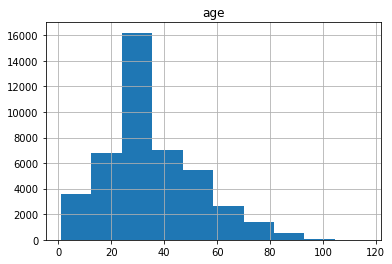

In [69]:
df_wiki_utk_appa.hist()

In [70]:
df_wiki_utk_appa['age'].value_counts()

26     2632
24     1593
28     1575
25     1573
30     1382
       ... 
98        2
97        2
101       1
111       1
103       1
Name: age, Length: 107, dtype: int64

In [71]:
df_wiki_utk_appa = df_wiki_utk_appa[df_wiki_utk_appa['age'] <= 100]
df_wiki_utk_appa = df_wiki_utk_appa[df_wiki_utk_appa['age'] > 0]

In [72]:
df_wiki_utk_appa['age'].min(), df_wiki_utk_appa['age'].max()

(1, 100)

In [73]:
df_wiki_utk_appa['age'] = df_wiki_utk_appa['age'].astype(int)

In [74]:
path_wiki_utk_appa = Path('../working/wiki_utk/')

np.random.seed(42)

data_wiki_small_src = (ImageList.from_df(df_wiki_utk_appa, path_wiki_utk_appa, cols=['full_path'], folder='.')
                   .split_by_rand_pct(0.2, seed=42)
                   .label_from_df(label_cls=FloatList))
                   
# data_wiki_big = ImageList.from_df(df_wiki_utk_appa, path_wiki_utk_appa, cols=['full_path'], folder='.').split_by_rand_pct(0.2, seed=42).label_from_df(label_cls=FloatList).transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=256).databunch(bs=64*2,num_workers=0).normalize(imagenet_stats)


In [75]:
data_wiki_small = (data_wiki_small_src.transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=128)
                   .databunch(bs=64,num_workers=0).normalize(imagenet_stats))

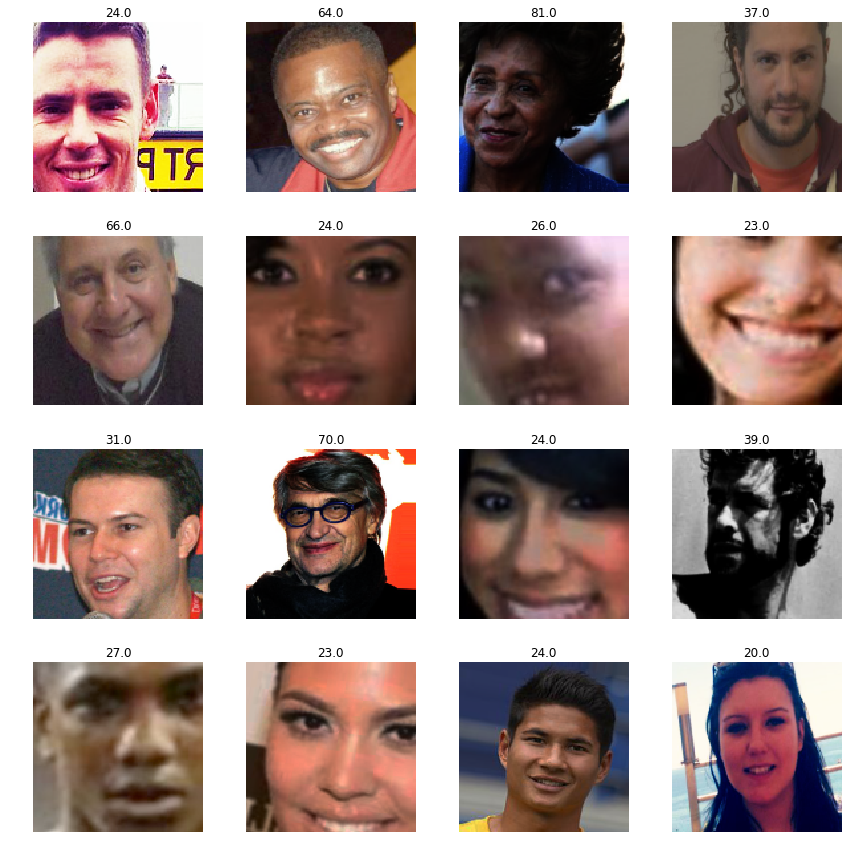

In [76]:
data_wiki_small.show_batch(4, figsize=(12,12))

## Fastai Age Model

In [77]:
class AgeModel(nn.Module):
    def __init__(self):
        super().__init__()
        layers = list(models.resnet34(pretrained=True).children())[:-2]
        layers += [AdaptiveConcatPool2d(), Flatten()]
        #layers += [nn.BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)]
        #layers += [nn.Dropout(p=0.60)]
        #layers += [nn.Linear(4096, 1024, bias=True), nn.ReLU(inplace=True)]
        #layers += [nn.BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)]
        #layers += [nn.Dropout(p=0.60)]
        #layers += [nn.Linear(2048, 1024, bias=True), nn.ReLU(inplace=True)]
        #layers += [nn.BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)]
        #layers += [nn.Dropout(p=0.75)]
        #layers += [nn.Linear(1024, 256, bias=True), nn.ReLU(inplace=True)]
        #layers += [nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)]
        #layers += [nn.Dropout(p=0.50)]
        #layers += [nn.Linear(512,256 , bias=True), nn.ReLU(inplace=True)]
        layers += [nn.BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)]
        layers += [nn.Dropout(p=0.50)]
        layers += [nn.Linear(1024, 512, bias=True), nn.ReLU(inplace=True)]
        layers += [nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)]
        layers += [nn.Dropout(p=0.50)]
        layers += [nn.Linear(512, 16, bias=True), nn.ReLU(inplace=True)]
        layers += [nn.Linear(16,1)]
        self.agemodel = nn.Sequential(*layers)
    def forward(self, x):
        return self.agemodel(x).squeeze(-1)
          # could add 116*torch.sigmoid

In [78]:
model = AgeModel()

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /tmp/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 92.9MB/s]


In [79]:
learn = Learner(data_wiki_small, model, model_dir = "/temp/model/", opt_func=opt_func, bn_wd=False, metrics=root_mean_squared_error,
               callback_fns=[ShowGraph]).mixup(stack_y=False, alpha=0.2)

learn.loss_func = L1LossFlat()

In [80]:
learn.split([model.agemodel[4],model.agemodel[6],model.agemodel[8]])

Learner(data=ImageDataBunch;

Train: LabelList (34909 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: FloatList
52.0,34.0,36.0,23.0,78.0
Path: ../working/wiki_utk;

Valid: LabelList (8727 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: FloatList
29.0,58.0,22.0,12.0,32.0
Path: ../working/wiki_utk;

Test: None, model=AgeModel(
  (agemodel): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

In [81]:
#learn = cnn_learner(data, resnet50, pretrained = True, model_dir = "/temp/model/",callback_fns=[ShowGraph])
#learn.loss_func = L1LossFlat()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.98E-02
Min loss divided by 10: 9.12E-02


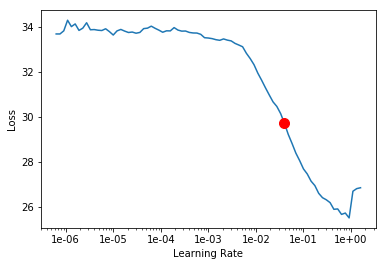

In [82]:
import fastai
learn.freeze_to(-1)
learn.lr_find()
learn.recorder.plot(suggestion = True)

In [83]:
lr = 2e-2

epoch,train_loss,valid_loss,root_mean_squared_error,time
0,9.605057,9.252867,13.258863,07:27
1,8.392913,7.800601,11.307045,07:26
2,7.934024,8.536113,12.432997,07:25
3,7.214382,6.707546,9.728629,07:25
4,7.115435,6.620564,9.895959,07:26


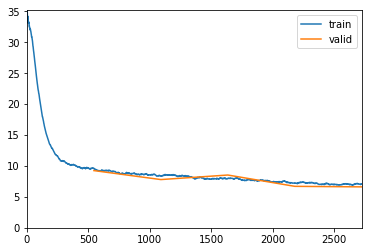

Better model found at epoch 0 with valid_loss value: 9.252866744995117.
Better model found at epoch 1 with valid_loss value: 7.800601005554199.
Better model found at epoch 3 with valid_loss value: 6.707545757293701.
Better model found at epoch 4 with valid_loss value: 6.620563507080078.


In [84]:
learn.fit_one_cycle(5, max_lr=slice(lr), wd=(1e-6, 1e-4, 1e-2, 1e-1), pct_start=0.5, callbacks=[SaveModelCallback(learn)])

In [85]:
learn.save('first_head_resnet34')
learn.load('first_head_resnet34')

Learner(data=ImageDataBunch;

Train: LabelList (34909 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: FloatList
52.0,34.0,36.0,23.0,78.0
Path: ../working/wiki_utk;

Valid: LabelList (8727 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: FloatList
29.0,58.0,22.0,12.0,32.0
Path: ../working/wiki_utk;

Test: None, model=AgeModel(
  (agemodel): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.91E-06
Min loss divided by 10: 6.92E-07


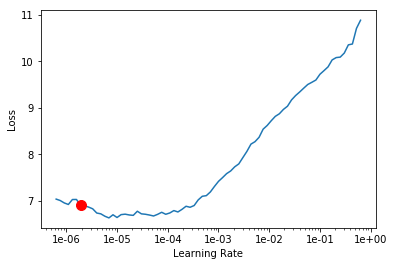

In [86]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion = True)

epoch,train_loss,valid_loss,root_mean_squared_error,time
0,7.085314,7.008016,10.614280,07:32
1,7.218247,6.842098,9.879888,07:31
2,6.800269,6.805061,9.620695,07:30
3,6.229340,5.717019,8.594589,07:30
4,6.011308,5.505085,8.282001,07:31


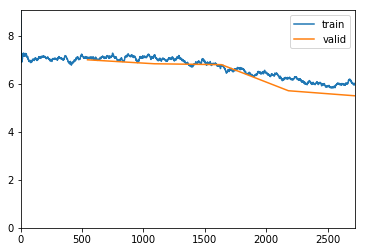

Better model found at epoch 0 with valid_loss value: 7.008016109466553.
Better model found at epoch 1 with valid_loss value: 6.842098236083984.
Better model found at epoch 2 with valid_loss value: 6.805061340332031.
Better model found at epoch 3 with valid_loss value: 5.7170186042785645.
Better model found at epoch 4 with valid_loss value: 5.505085468292236.


In [87]:
learn.fit_one_cycle(5, max_lr=slice(1e-6, lr/5), wd=(1e-6, 1e-4, 1e-2, 1e-1), 
                    callbacks=[SaveModelCallback(learn)], pct_start=0.5)

In [88]:
x,y = next(iter(learn.data.train_dl))
x.shape

torch.Size([64, 3, 128, 128])

In [89]:
learn.save('first_body_resnet34')
learn.load('first_body_resnet34')

Learner(data=ImageDataBunch;

Train: LabelList (34909 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: FloatList
52.0,34.0,36.0,23.0,78.0
Path: ../working/wiki_utk;

Valid: LabelList (8727 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: FloatList
29.0,58.0,22.0,12.0,32.0
Path: ../working/wiki_utk;

Test: None, model=AgeModel(
  (agemodel): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

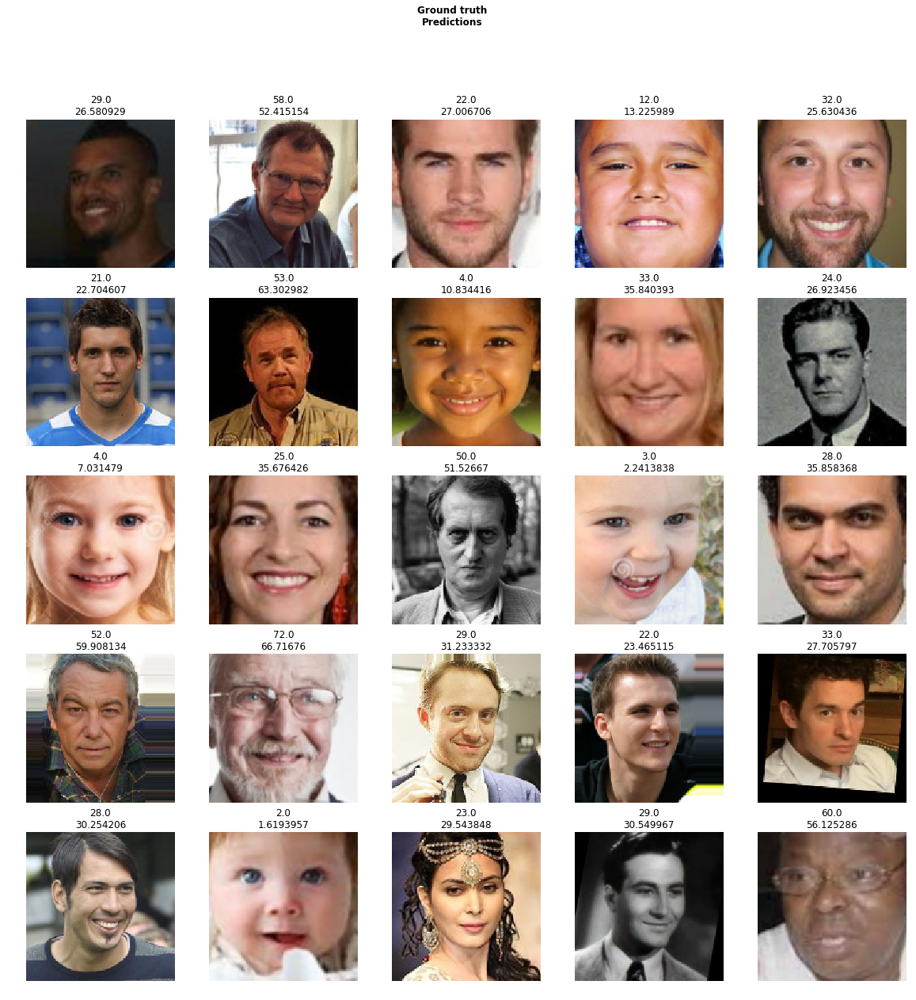

In [90]:
learn.show_results()

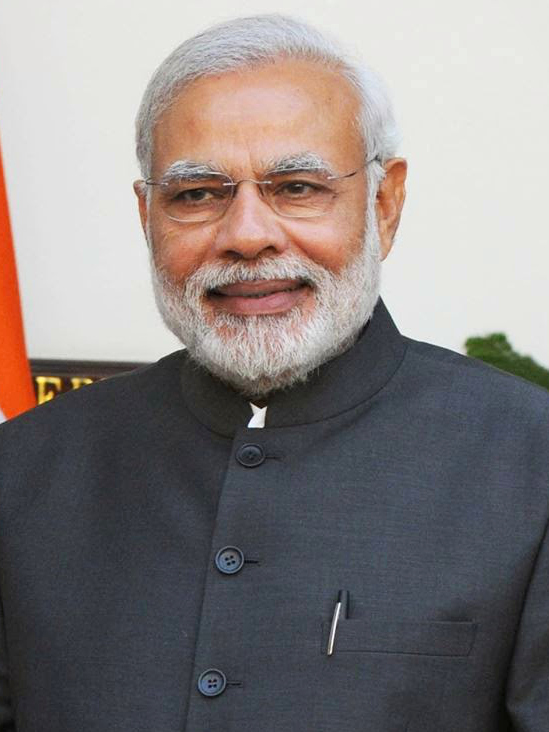

In [91]:
img = open_image('../input/picture4/PM_Modi_2015.jpg')
img

In [92]:
x = learn.predict(img)
x

(FloatItem 61.401455, tensor(61.4015), tensor(61.4015))

## Image Resizing

In [93]:
data_wiki_big = (data_wiki_small_src.transform(tfms, size=256)
        .databunch(num_workers=0).normalize(imagenet_stats))

learn.data = data_wiki_big
data_wiki_big.train_ds[0][0].shape

torch.Size([3, 256, 256])

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 9.12E-07
Min loss divided by 10: 5.75E-03


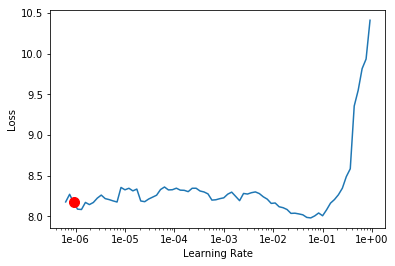

In [94]:
learn.freeze_to(-1)
learn.lr_find()
learn.recorder.plot(suggestion = True)

In [95]:
lr = 5e-4

epoch,train_loss,valid_loss,root_mean_squared_error,time
0,7.837380,6.402583,9.601757,14:34
1,7.332215,6.078465,9.117067,14:26
2,7.223328,5.939247,8.911067,14:18
3,6.803191,5.813476,8.721518,14:18
4,7.061768,5.878111,8.838454,14:21


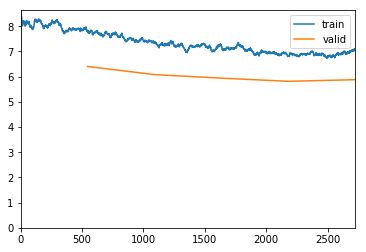

Better model found at epoch 0 with valid_loss value: 6.402583122253418.
Better model found at epoch 1 with valid_loss value: 6.078464984893799.
Better model found at epoch 2 with valid_loss value: 5.939246654510498.
Better model found at epoch 3 with valid_loss value: 5.813475608825684.


In [96]:
learn.fit_one_cycle(5, max_lr=slice(lr), wd=(1e-6, 1e-4, 1e-2, 1e-1), pct_start=0.5, callbacks=[SaveModelCallback(learn)])

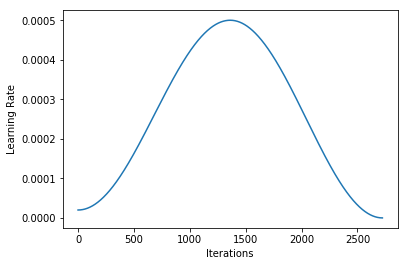

In [97]:
learn.recorder.plot_lr()

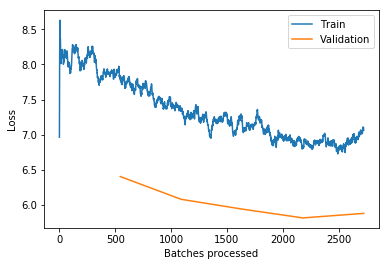

In [98]:
learn.recorder.plot_losses()

In [99]:
learn.save('second_head_resnet34')
learn.load('second_head_resnet34')

Learner(data=ImageDataBunch;

Train: LabelList (34909 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
52.0,34.0,36.0,23.0,78.0
Path: ../working/wiki_utk;

Valid: LabelList (8727 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
29.0,58.0,22.0,12.0,32.0
Path: ../working/wiki_utk;

Test: None, model=AgeModel(
  (agemodel): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

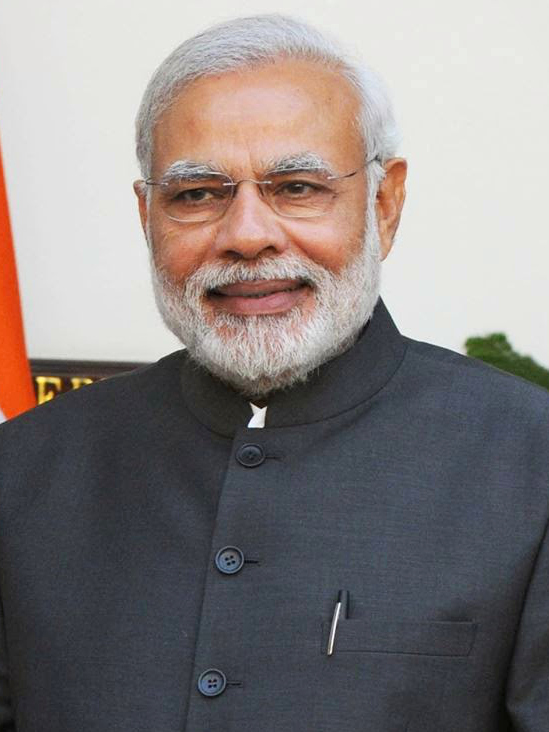

In [100]:
img = open_image('../input/picture4/PM_Modi_2015.jpg')
img

In [101]:
learn.predict(img)

(FloatItem 61.38315, tensor(61.3831), tensor(61.3831))

In [102]:
x,y = next(iter(learn.data.train_dl))
x.shape

torch.Size([64, 3, 256, 256])

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 9.12E-07
Min loss divided by 10: 3.02E-06


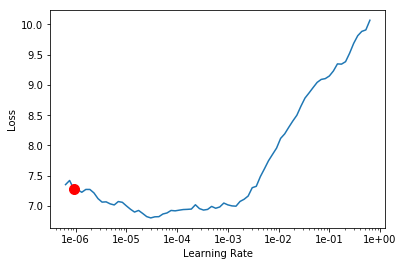

In [103]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion = True)

epoch,train_loss,valid_loss,root_mean_squared_error,time
0,6.700283,5.710420,8.648839,14:52
1,6.323674,5.421929,8.128598,15:00
2,6.052965,5.245904,7.984351,14:55
3,5.895456,5.199911,7.924792,14:54
4,5.728145,5.103240,7.743491,14:55


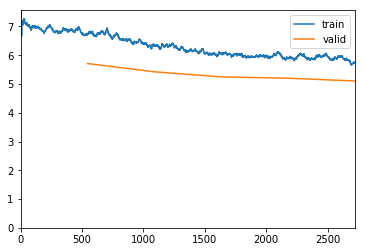

Better model found at epoch 0 with valid_loss value: 5.71042013168335.
Better model found at epoch 1 with valid_loss value: 5.421929359436035.
Better model found at epoch 2 with valid_loss value: 5.245903968811035.
Better model found at epoch 3 with valid_loss value: 5.199910640716553.
Better model found at epoch 4 with valid_loss value: 5.103240489959717.


In [104]:
learn.fit_one_cycle(5, max_lr=slice(1e-6,1e-4), wd=(1e-6, 1e-4, 1e-2, 1e-1), callbacks=[SaveModelCallback(learn)], pct_start=0.5)

In [105]:
learn.save('second_body_resnet34')
learn.load('second_body_resnet34')

Learner(data=ImageDataBunch;

Train: LabelList (34909 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
52.0,34.0,36.0,23.0,78.0
Path: ../working/wiki_utk;

Valid: LabelList (8727 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
29.0,58.0,22.0,12.0,32.0
Path: ../working/wiki_utk;

Test: None, model=AgeModel(
  (agemodel): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

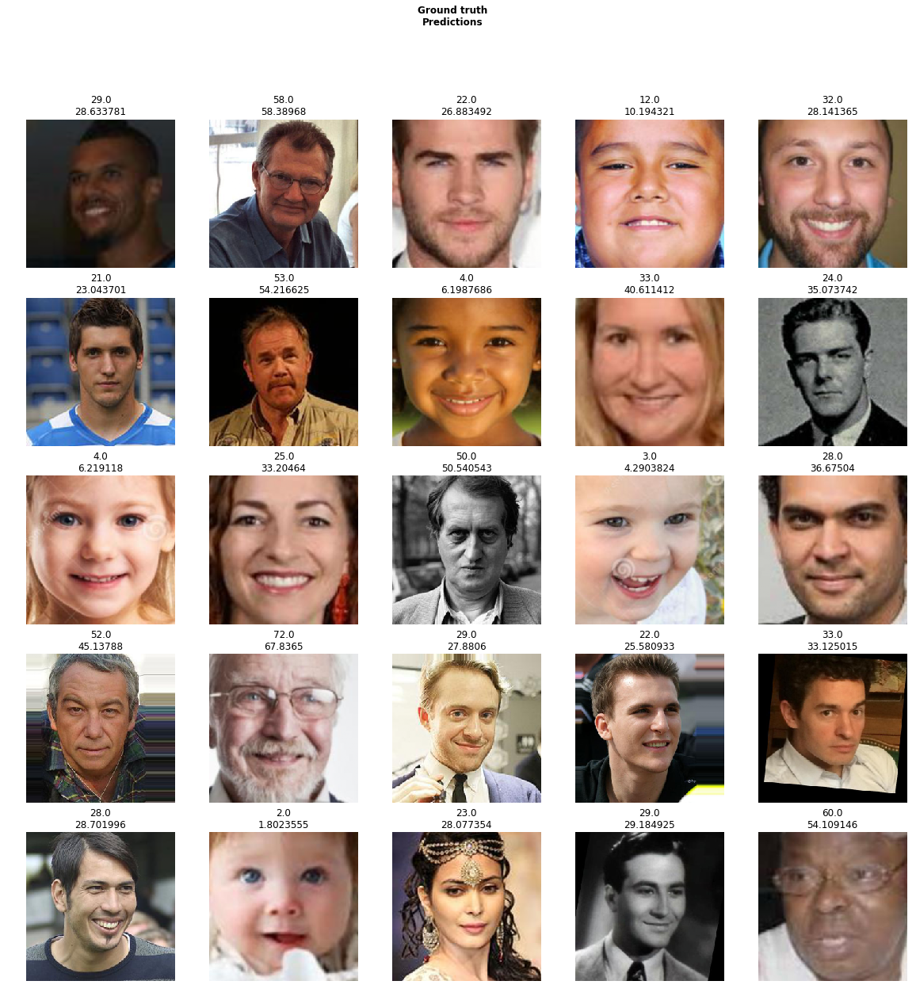

In [106]:
learn.show_results()

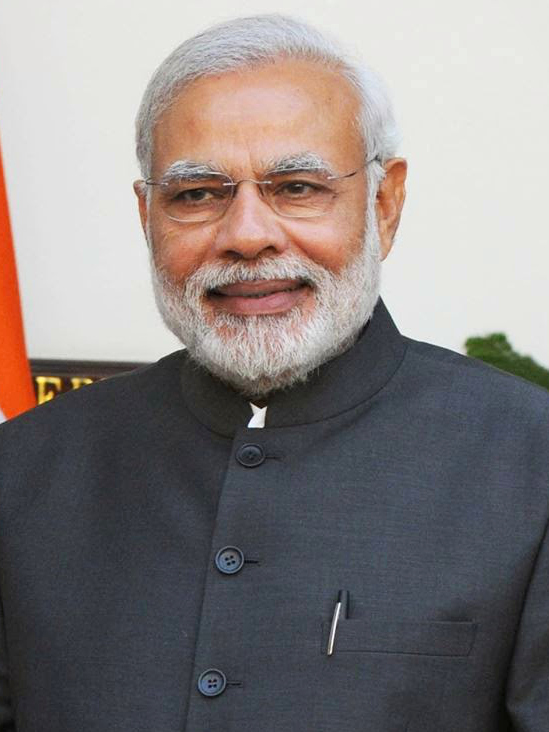

In [107]:
img = open_image('../input/picture4/PM_Modi_2015.jpg')
img

In [108]:
x = learn.predict(img)
x

(FloatItem 63.15648, tensor(63.1565), tensor(63.1565))

In [109]:
learn.save('third_body_resnet34')
learn.load('third_body_resnet34')

Learner(data=ImageDataBunch;

Train: LabelList (34909 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
52.0,34.0,36.0,23.0,78.0
Path: ../working/wiki_utk;

Valid: LabelList (8727 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: FloatList
29.0,58.0,22.0,12.0,32.0
Path: ../working/wiki_utk;

Test: None, model=AgeModel(
  (agemodel): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

# Fastai Hooks

In [110]:
class SaveFeatures():
    features=None
    def __init__(self, m): 
        self.hook = m.register_forward_hook(self.hook_fn)
        self.features = None
    def hook_fn(self, module, input, output): 
        out = output.detach().cpu().numpy()
        if isinstance(self.features, type(None)):
            self.features = out
        else:
            self.features = np.row_stack((self.features, out))
    def remove(self): 
        self.hook.remove()

In [111]:
learn.model

AgeModel(
  (agemodel): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=Tru

In [112]:
# Second last layer of the model
learn.model.agemodel[16]

Linear(in_features=512, out_features=16, bias=True)

In [113]:
len(data_wiki_big.train_ds.items), len(data_wiki_big.valid_ds.items)

(34909, 8727)

In [114]:
sf = SaveFeatures(learn.model.agemodel[16])

In [115]:
_= learn.get_preds(data_wiki_big.train_ds)
_= learn.get_preds(DatasetType.Valid)

In [116]:
len(sf.features)

43636

In [117]:
img_path = [str(x) for x in (list(data_wiki_big.train_ds.items) +list(data_wiki_big.valid_ds.items))]
label = [x for x in (list(data_wiki_big.train_ds.y.items) +list(data_wiki_big.valid_ds.y.items))]
label_id = [x for x in (list(data_wiki_big.train_ds.y.items) +list(data_wiki_big.valid_ds.y.items))]

In [118]:
df_new = pd.DataFrame({'img_path': img_path, 'label': label, 'label_id': label_id})
df_new

,img_path,label,label_id
0,../working/wiki_utk/./10002702_1960-11-09_2012...,52.0,52.0
1,../working/wiki_utk/./10003541_1937-09-27_1971...,34.0,34.0
2,../working/wiki_utk/./1000456_1933-06-12_1969.jpg,36.0,36.0
3,../working/wiki_utk/./10004882_1987-05-16_2010...,23.0,23.0
4,../working/wiki_utk/./1000781_1930-07-07_2008.jpg,78.0,78.0
...,...,...,...
43631,../working/wiki_utk/./007148.jpg,20.0,20.0
43632,../working/wiki_utk/./4948808_1983-11-16_2007.jpg,24.0,24.0
43633,../working/wiki_utk/./6_1_4_20170119204208503....,6.0,6.0
43634,../working/wiki_utk/./26_0_4_20170117154446109...,26.0,26.0


In [119]:
array = np.array(sf.features)

In [120]:
x=array.tolist()

In [121]:
df_new['img_repr'] = x

In [122]:
df_new

,img_path,label,label_id,img_repr
0,../working/wiki_utk/./10002702_1960-11-09_2012...,52.0,52.0,"[72.47952270507812, -8.392868041992188, -9.617..."
1,../working/wiki_utk/./10003541_1937-09-27_1971...,34.0,34.0,"[72.01614379882812, -7.710638999938965, -8.909..."
2,../working/wiki_utk/./1000456_1933-06-12_1969.jpg,36.0,36.0,"[69.15504455566406, -7.593712329864502, -8.700..."
3,../working/wiki_utk/./10004882_1987-05-16_2010...,23.0,23.0,"[49.39116668701172, -7.189101696014404, -7.045..."
4,../working/wiki_utk/./1000781_1930-07-07_2008.jpg,78.0,78.0,"[134.6729736328125, -16.601808547973633, -19.6..."
...,...,...,...,...
43631,../working/wiki_utk/./007148.jpg,20.0,20.0,"[42.290016174316406, -7.002415657043457, -6.35..."
43632,../working/wiki_utk/./4948808_1983-11-16_2007.jpg,24.0,24.0,"[28.6945743560791, -7.378058910369873, -5.9204..."
43633,../working/wiki_utk/./6_1_4_20170119204208503....,6.0,6.0,"[49.36155700683594, -6.653528213500977, -6.824..."
43634,../working/wiki_utk/./26_0_4_20170117154446109...,26.0,26.0,"[49.14276885986328, -5.3559465408325195, -5.08..."


In [123]:
df_new.shape

(43636, 4)

# Annoy

In [124]:
from annoy import AnnoyIndex

f = len(df_new['img_repr'][0])
t = AnnoyIndex(f, metric='euclidean')

In [125]:
ntree = 1000

for i, vector in enumerate(df_new['img_repr']):
    t.add_item(i, vector)
_  = t.build(ntree)

In [126]:
import time
def get_similar_images_annoy(img_index, num):
    start = time.time()
    base_img_id, base_vector, base_label  = df_new.iloc[img_index, [0,3,1]]
    similar_img_ids = t.get_nns_by_item(img_index, num)
    end = time.time()
    print(f'{(end - start) * 1000} ms')
    return base_img_id, base_label, df_new.iloc[similar_img_ids]

In [127]:
num = 89
base_image, base_label, similar_images_df = get_similar_images_annoy(890, num)

70.15395164489746 ms


21.0


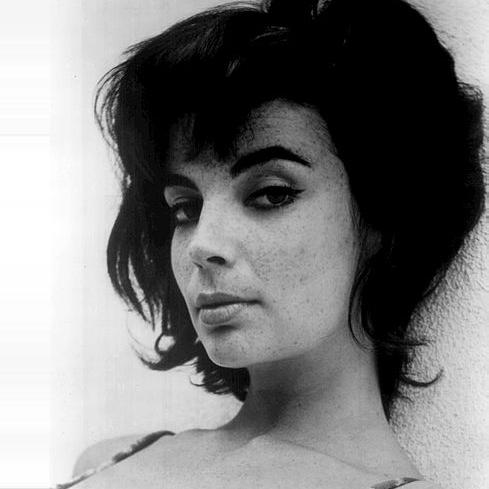

In [128]:
print(base_label)
open_image(base_image)

In [129]:
similar_images_df

,img_path,label,label_id,img_repr
890,../working/wiki_utk/./950234_1941-03-06_1962.jpg,21.0,21.0,"[44.051395416259766, -8.610692024230957, -7.61..."
10285,../working/wiki_utk/./1575279_1978-12-28_2014.jpg,36.0,36.0,"[44.23878479003906, -8.540730476379395, -7.615..."
40921,../working/wiki_utk/./23465846_1989-07-10_2010...,21.0,21.0,"[44.385948181152344, -8.653063774108887, -7.68..."
11172,../working/wiki_utk/./4182570_1978-06-26_2012.jpg,34.0,34.0,"[44.501441955566406, -8.626776695251465, -7.64..."
34427,../working/wiki_utk/./007004.jpg,27.0,27.0,"[44.107200622558594, -8.570219993591309, -7.66..."
...,...,...,...,...
3505,../working/wiki_utk/./25239834_1992-01-23_2015...,23.0,23.0,"[44.192176818847656, -8.403630256652832, -7.45..."
40902,../working/wiki_utk/./1691972_1933-02-18_1968.jpg,35.0,35.0,"[45.43599319458008, -8.536643981933594, -7.595..."
12401,../working/wiki_utk/./1190101_1979-11-13_2010.jpg,31.0,31.0,"[45.04903793334961, -8.50577449798584, -7.5224..."
40885,../working/wiki_utk/./4094157_1990-03-01_2009.jpg,19.0,19.0,"[43.83957290649414, -8.407843589782715, -7.513..."


In [130]:
data_src = (ImageList.from_df(similar_images_df, path=".",cols=['img_path'], folder='.' )
        .split_none()
        .label_from_df(cols=['label'],label_cls=FloatList))

In [131]:
data = (data_src.transform(tfms, resize_method=ResizeMethod.CROP, padding_mode='border', size=256)
                   .databunch(bs=num,num_workers=0).normalize(imagenet_stats))

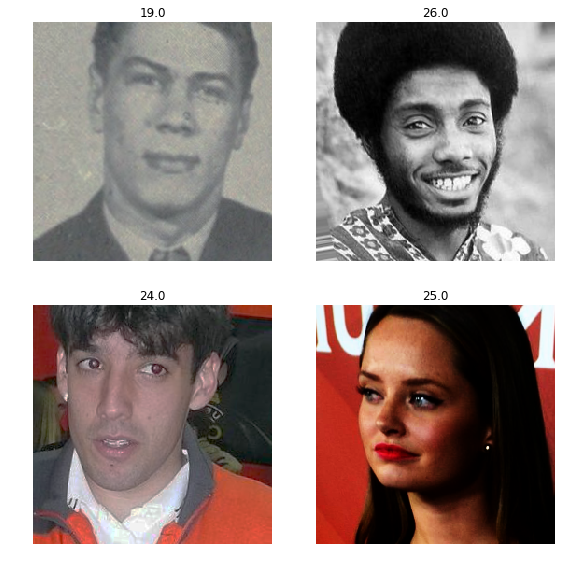

In [132]:
data.show_batch(2)